In [78]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import csv
from networkx.algorithms import community as comx
from pandas.errors import EmptyDataError 
%matplotlib inline
import community

In [2]:
G=nx.DiGraph()

In [3]:
data=pd.read_csv("handles.csv")
data.head()
df=pd.DataFrame(data)
df.head()

,S.no,Name,Instagram user
0,1,British Library,britishlibrary
1,2,Library of Congress,librarycongress
2,3,New York Public Library,nypl
3,4,Library and Archives Canada,libraryarchives
4,5,Russian State Library,leninka_official


In [4]:
df["Instagram user"][0]
df.shape[0]

70

C:\Users\Aditi\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


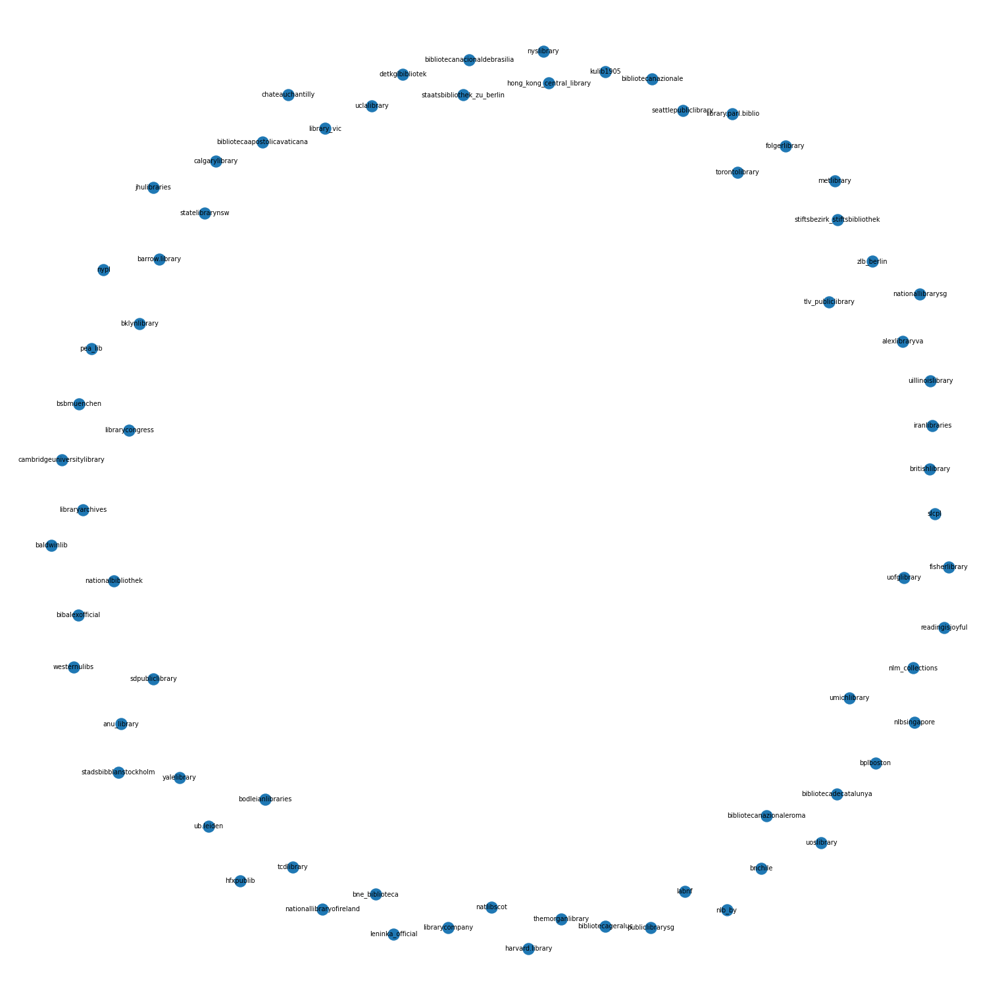

In [5]:
for i in range(0,70):
    G.add_node(df["Instagram user"][i])
    
plt.rcParams["figure.figsize"] = [15, 15]
plt.rcParams["figure.autolayout"] = True


#fig = plt.figure(6, figsize=(200, 200))
#fig=plt.figure(figsize=(200,200))
nx.draw(G,with_labels=True,node_size=150,font_size=7)
plt.show()

,S.no,Name,Instagram user
0,1,British Library,britishlibrary
1,2,Library of Congress,librarycongress
2,3,New York Public Library,nypl
3,4,Library and Archives Canada,libraryarchives
4,5,Russian State Library,leninka_official
...,...,...,...
66,67,Toronto Public Library,torontolibrary
67,68,Western Libraries,westernulibs
68,69,University Of Glasgow Library,uofglibrary
69,70,National Library of Scotland,natlibscot


In [6]:
def adding(df,libname):
    df.insert(len(df.columns),"{lname}".format(lname=libname),0)
    return df
    
df_follows=df.copy()

for i in range(0,70):
    df_follows=adding(df_follows,df.iloc[i,1])

In [7]:
list(df_follows.columns.values)

['S.no',
 'Name',
 'Instagram user',
 'British Library ',
 'Library of Congress ',
 'New York Public Library ',
 'Library and Archives Canada ',
 'Russian State Library ',
 'Royal Library Denmark ',
 'Bibliotheque nationale de Fr',
 'University of Illinois Library ',
 'Bavarian State Library ',
 'Biblioteca Nacional de Espana',
 'Berlin State Library ',
 'Boston Public Library ',
 'New York State Library ',
 'Harvard Library ',
 'University of Michigan Library ',
 'Yale Library ',
 'National Library of Iran ',
 'Bodleian Library  Oxford, United',
 'Vatican Library  ',
 'thomas j watson library ',
 'state library nsw',
 'Library of Parliament Ottawa',
 'Thomas Fisher Rare Book Library',
 'Seattle Public Library',
 'Abbey Library of Saint Gall ',
 'Austrian National Library',
 'The Morgan Library & Museum',
 'Trinity College Library ',
 'Salt Lake City Public Library',
 'State Library of Victoria',
 'Chateau de Chantilly Library',
 'George Peabody Library ',
 'Phillips Exeter Academy Lib

In [8]:
df_follows

,S.no,Name,Instagram user,British Library,Library of Congress,New York Public Library,Library and Archives Canada,Russian State Library,Royal Library Denmark,Bibliotheque nationale de Fr,...,Cambridge University Library,Public Libraries Singapore,San Diego Public Library,Baldwin Public Library,hong kong central library,Toronto Public Library,Western Libraries,University Of Glasgow Library,National Library of Scotland,UCLA Library
0,1,British Library,britishlibrary,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,Library of Congress,librarycongress,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3,New York Public Library,nypl,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,Library and Archives Canada,libraryarchives,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,5,Russian State Library,leninka_official,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,66,Toronto Public Library,torontolibrary,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
66,67,Western Libraries,westernulibs,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
67,68,University Of Glasgow Library,uofglibrary,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
68,69,National Library of Scotland,natlibscot,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [9]:

def follows(df,column_name,column_number):
    try:
        col_data=pd.read_csv("{lname}.csv".format(lname=column_name),header=None)
        coldf=pd.DataFrame(col_data)
        size=coldf.shape[0]
        for i in range(0,size):
            following=coldf.iloc[i,0]
            if following in list(df.iloc[:,2]):
                index=list(df.iloc[:,2]).index("{fl}".format(fl=following))
                df.iloc[index,column_number]=1
    except EmptyDataError:
        pass
    except FileNotFoundError:
        pass


In [10]:
count=3
for column in df_follows.columns[3:]:
    #print(column)
   #print(count)
    follows(df_follows,column,count)
    count=count+1


In [11]:
#if "britishelibrary" in list(df.iloc[:,2]):
    #print("yes")
#else:
    #print("no")
    
    
#df.index[df['BoolCol'] == True].tolist()
#index=list(df.iloc[:,2]).index("nypl")
#index

#df_follows.iloc[2,3]
#df_follows.iloc[2,3]=0
#df_follows

pd.set_option("display.max_columns",None)
df_follows

,S.no,Name,Instagram user,British Library,Library of Congress,New York Public Library,Library and Archives Canada,Russian State Library,Royal Library Denmark,Bibliotheque nationale de Fr,University of Illinois Library,Bavarian State Library,Biblioteca Nacional de Espana,Berlin State Library,Boston Public Library,New York State Library,Harvard Library,University of Michigan Library,Yale Library,National Library of Iran,"Bodleian Library Oxford, United",Vatican Library,thomas j watson library,state library nsw,Library of Parliament Ottawa,Thomas Fisher Rare Book Library,Seattle Public Library,Abbey Library of Saint Gall,Austrian National Library,The Morgan Library & Museum,Trinity College Library,Salt Lake City Public Library,State Library of Victoria,Chateau de Chantilly Library,George Peabody Library,Phillips Exeter Academy Library,The Library of Alexandria,Stockholm Public Library,The National Library of Singapore,University of Coimbra General Library,National Library Minsk,Central National Library of Rome,Folger Shakespeare Library,Library Company of Philadelphia,National Library of Ireland,National Library of Medicine,National Library Singapore,korea Univ library,University of seoul lib,Alexandria Library virginia,Zentral- und Landesbibliothek Berlin (ZLB),Barrow Library & Archives,ANU Library,"Beit Ariela, Tel Aviv, Israel",Biblioteca de Catalunya,Biblioteca Nacional Brasilia,Brooklyn Public Library,Biblioteca Nacional de Chile,Biblioteca Nazionale Firenze,Calgary Public Library,Halifax Public Libraries,honk kong public lib,Universitaire Bibliotheken Leiden,Cambridge University Library,Public Libraries Singapore,San Diego Public Library,Baldwin Public Library,hong kong central library,Toronto Public Library,Western Libraries,University Of Glasgow Library,National Library of Scotland,UCLA Library
0,1,British Library,britishlibrary,0,0,1,0,1,1,1,0,1,1,1,0,0,0,0,0,0,1,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,1,0,1,1,0,0,1,1,0,1,0,0,1,0,0,0,1,0,0,0,0,0
1,2,Library of Congress,librarycongress,1,0,1,0,1,0,1,1,0,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2,3,New York Public Library,nypl,1,1,0,0,1,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,1,0,1,1,1,0,0,0,1,0,0,1,0,1,1,0,0,1,1,1,1,0,0,1,1,0,0,0,0,0,0,0,1
3,4,Library and Archives Canada,libraryarchives,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
4,5,Russian State Library,leninka_official,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,66,Toronto Public Library,torontolibrary,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
66,67,Western Libraries,westernulibs,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
67,68,University Of Glasgow Library,uofglibrary,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0
68,69,National Library of Scotland,natlibscot,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [12]:
#adding edges:
for i in range(3,73):
    for j in range(0,70):
        if df_follows.iloc[j,i]==1:
            username=i-3
            G.add_edges_from([(df_follows.iloc[username,2],df_follows.iloc[j,2])])
    


C:\Users\Aditi\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


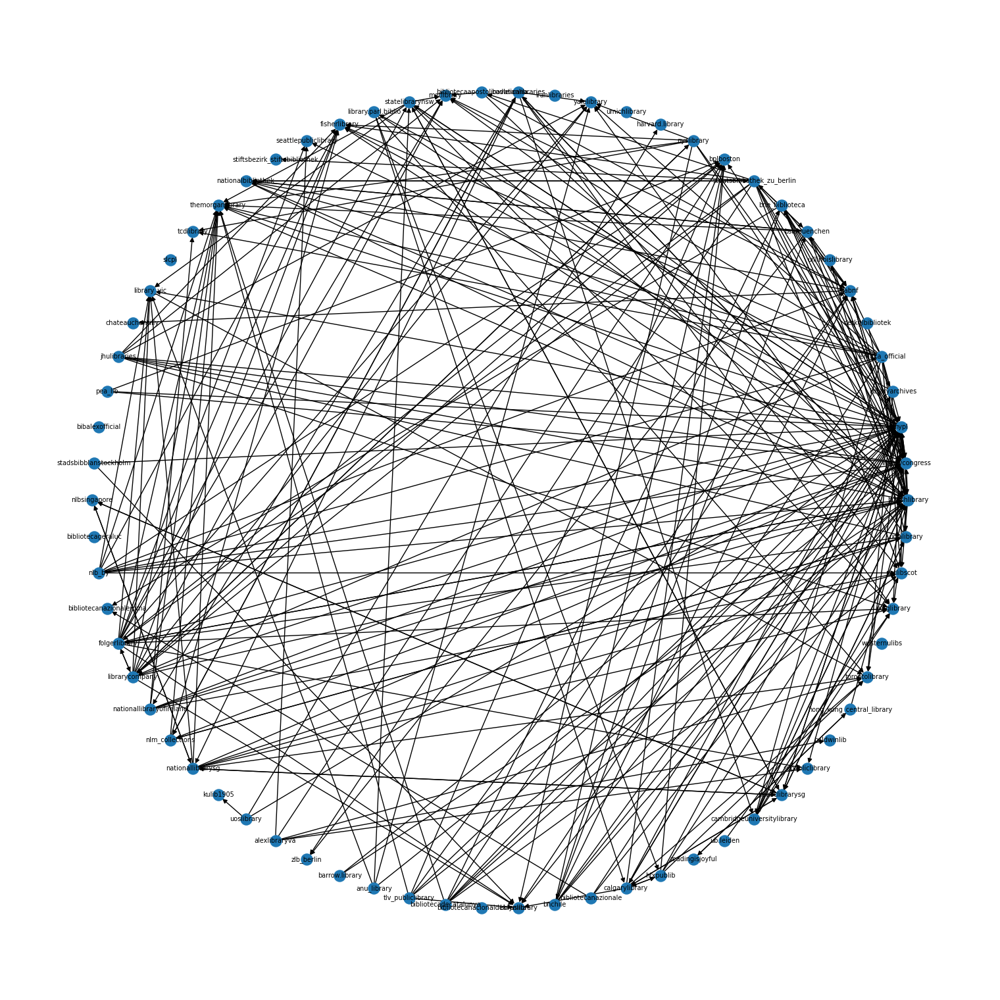

In [13]:
nx.draw_circular(G,with_labels=True,node_size=150,font_size=7)


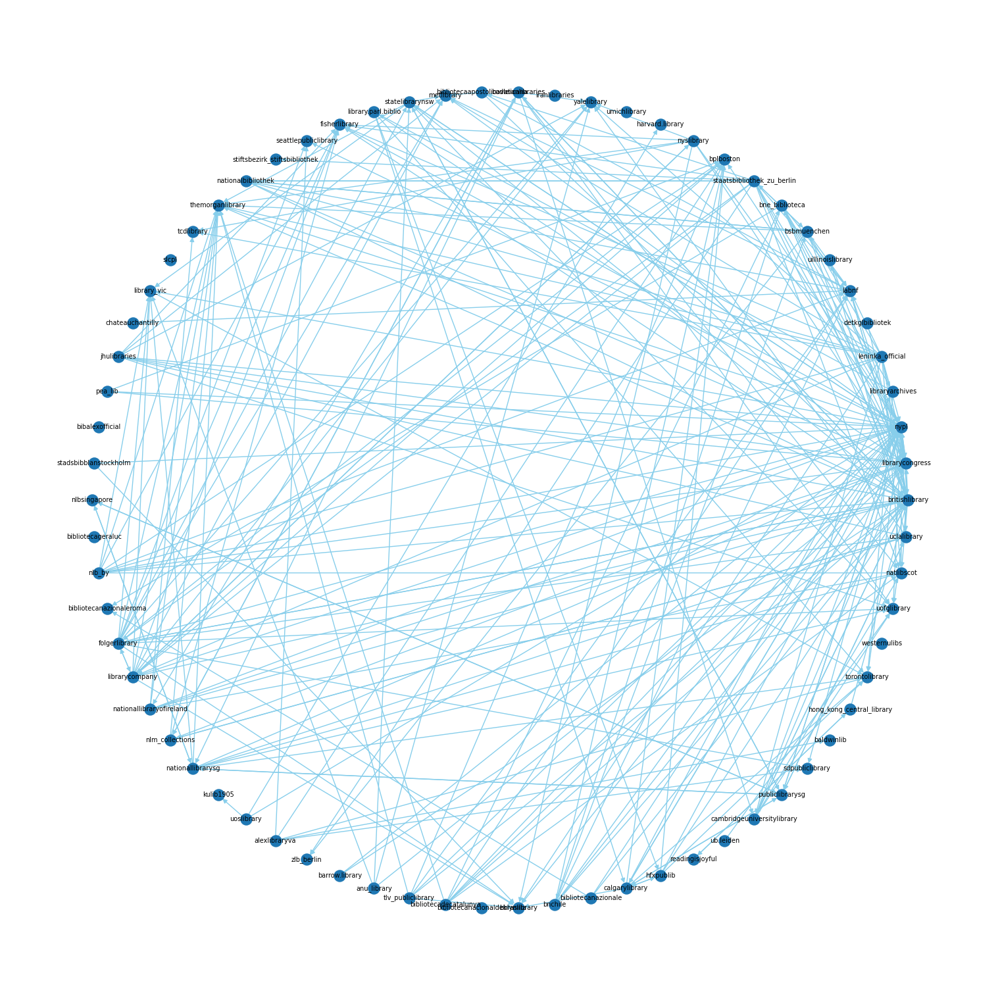

In [14]:
nx.draw_circular(G,with_labels=True,node_size=150,font_size=7,edge_color="skyblue")


In [15]:
G.out_degree()

out_degree=list(G.out_degree)
out_degree
#len(out_degree)

[('britishlibrary', 11),
 ('librarycongress', 1),
 ('nypl', 17),
 ('libraryarchives', 2),
 ('leninka_official', 15),
 ('detkglbibliotek', 1),
 ('labnf', 4),
 ('uillinoislibrary', 1),
 ('bsbmuenchen', 7),
 ('bne_biblioteca', 7),
 ('staatsbibliothek_zu_berlin', 13),
 ('bplboston', 0),
 ('nyslibrary', 8),
 ('harvard.library', 0),
 ('umichlibrary', 0),
 ('yalelibrary', 0),
 ('iranlibraries', 0),
 ('bodleianlibraries', 8),
 ('bibliotecaapostolicavaticana', 3),
 ('metlibrary', 0),
 ('statelibrarynsw', 7),
 ('library.parl.biblio', 4),
 ('fisherlibrary', 0),
 ('seattlepubliclibrary', 0),
 ('stiftsbezirk_stiftsbibliothek', 0),
 ('nationalbibliothek', 5),
 ('themorganlibrary', 0),
 ('tcdlibrary', 0),
 ('slcpl', 0),
 ('library_vic', 1),
 ('chateauchantilly', 0),
 ('jhulibraries', 8),
 ('pea_lib', 3),
 ('bibalexofficial', 0),
 ('stadsbibblanstockholm', 2),
 ('nlbsingapore', 2),
 ('bibliotecageraluc', 0),
 ('nlb_by', 10),
 ('bibliotecanazionaleroma', 0),
 ('folgerlibrary', 14),
 ('librarycompany', 

In [16]:
G.in_degree()

in_degree=list(G.in_degree())
in_degree

[('britishlibrary', 24),
 ('librarycongress', 20),
 ('nypl', 26),
 ('libraryarchives', 2),
 ('leninka_official', 1),
 ('detkglbibliotek', 0),
 ('labnf', 11),
 ('uillinoislibrary', 1),
 ('bsbmuenchen', 4),
 ('bne_biblioteca', 2),
 ('staatsbibliothek_zu_berlin', 2),
 ('bplboston', 10),
 ('nyslibrary', 1),
 ('harvard.library', 1),
 ('umichlibrary', 0),
 ('yalelibrary', 8),
 ('iranlibraries', 0),
 ('bodleianlibraries', 2),
 ('bibliotecaapostolicavaticana', 1),
 ('metlibrary', 8),
 ('statelibrarynsw', 4),
 ('library.parl.biblio', 1),
 ('fisherlibrary', 10),
 ('seattlepubliclibrary', 3),
 ('stiftsbezirk_stiftsbibliothek', 1),
 ('nationalbibliothek', 3),
 ('themorganlibrary', 14),
 ('tcdlibrary', 3),
 ('slcpl', 0),
 ('library_vic', 7),
 ('chateauchantilly', 1),
 ('jhulibraries', 0),
 ('pea_lib', 0),
 ('bibalexofficial', 0),
 ('stadsbibblanstockholm', 0),
 ('nlbsingapore', 2),
 ('bibliotecageraluc', 0),
 ('nlb_by', 0),
 ('bibliotecanazionaleroma', 2),
 ('folgerlibrary', 4),
 ('librarycompany',

In [17]:
idc=nx.in_degree_centrality(G)
idc

{'britishlibrary': 0.34782608695652173,
 'librarycongress': 0.2898550724637681,
 'nypl': 0.37681159420289856,
 'libraryarchives': 0.028985507246376812,
 'leninka_official': 0.014492753623188406,
 'detkglbibliotek': 0.0,
 'labnf': 0.15942028985507248,
 'uillinoislibrary': 0.014492753623188406,
 'bsbmuenchen': 0.057971014492753624,
 'bne_biblioteca': 0.028985507246376812,
 'staatsbibliothek_zu_berlin': 0.028985507246376812,
 'bplboston': 0.14492753623188406,
 'nyslibrary': 0.014492753623188406,
 'harvard.library': 0.014492753623188406,
 'umichlibrary': 0.0,
 'yalelibrary': 0.11594202898550725,
 'iranlibraries': 0.0,
 'bodleianlibraries': 0.028985507246376812,
 'bibliotecaapostolicavaticana': 0.014492753623188406,
 'metlibrary': 0.11594202898550725,
 'statelibrarynsw': 0.057971014492753624,
 'library.parl.biblio': 0.014492753623188406,
 'fisherlibrary': 0.14492753623188406,
 'seattlepubliclibrary': 0.043478260869565216,
 'stiftsbezirk_stiftsbibliothek': 0.014492753623188406,
 'nationalbib

In [18]:
type(nx.in_degree_centrality(G))
mxm=max(zip(idc.values(),idc.keys()))[1]
mnm=min(zip(idc.values(),idc.keys()))[1]
mxm,mnm

('nypl', 'alexlibraryva')

In [19]:
odc=nx.out_degree_centrality(G)
odc

{'britishlibrary': 0.15942028985507248,
 'librarycongress': 0.014492753623188406,
 'nypl': 0.2463768115942029,
 'libraryarchives': 0.028985507246376812,
 'leninka_official': 0.21739130434782608,
 'detkglbibliotek': 0.014492753623188406,
 'labnf': 0.057971014492753624,
 'uillinoislibrary': 0.014492753623188406,
 'bsbmuenchen': 0.10144927536231885,
 'bne_biblioteca': 0.10144927536231885,
 'staatsbibliothek_zu_berlin': 0.18840579710144928,
 'bplboston': 0.0,
 'nyslibrary': 0.11594202898550725,
 'harvard.library': 0.0,
 'umichlibrary': 0.0,
 'yalelibrary': 0.0,
 'iranlibraries': 0.0,
 'bodleianlibraries': 0.11594202898550725,
 'bibliotecaapostolicavaticana': 0.043478260869565216,
 'metlibrary': 0.0,
 'statelibrarynsw': 0.10144927536231885,
 'library.parl.biblio': 0.057971014492753624,
 'fisherlibrary': 0.0,
 'seattlepubliclibrary': 0.0,
 'stiftsbezirk_stiftsbibliothek': 0.0,
 'nationalbibliothek': 0.07246376811594203,
 'themorganlibrary': 0.0,
 'tcdlibrary': 0.0,
 'slcpl': 0.0,
 'library_v

In [20]:
mxmodc=max(zip(odc.values(),odc.keys()))[1]
mnmodc=min(zip(odc.values(),idc.keys()))[1]
mxmodc,mnmodc

('nypl', 'baldwinlib')

In [21]:
bc=nx.betweenness_centrality(G)
mxmbc=max(zip(bc.values(),bc.keys()))[1]
mnmbc=min(zip(bc.values(),bc.keys()))[1]
mxmbc,mnmbc

('britishlibrary', 'alexlibraryva')

In [80]:
communities_generator = comx.girvan_newman(G)

top_level_communities = next(communities_generator)

len(top_level_communities)

#next_level_communities = next(communities_generator)

#sorted(map(sorted, next_level_communities))

9

In [23]:
 def set_node_community(G, communities):
        '''Add community to node attributes'''
        for c, v_c in enumerate(communities):
            for v in v_c:
                # Add 1 to save 0 for external edges
                G.nodes[v]['community'] = c + 1
                
def set_edge_community(G):
    '''Find internal edges and add their community to their attributes'''
    for v, w, in G.edges:
        if G.nodes[v]['community'] == G.nodes[w]['community']:
            # Internal edge, mark with community
            G.edges[v, w]['community'] = G.nodes[v]['community']
        else:
            # External edge, mark as 0
            G.edges[v, w]['community'] = 0
            
            
def get_color(i, r_off=1, g_off=1, b_off=1):
    '''Assign a color to a vertex.'''
    r0, g0, b0 = 0, 0, 0
    n = 16
    low, high = 0.1, 0.9
    span = high - low
    r = low + span * (((i + r_off) * 3) % n) / (n - 1)
    g = low + span * (((i + g_off) * 5) % n) / (n - 1)
    b = low + span * (((i + b_off) * 7) % n) / (n - 1)
    return (r, g, b)

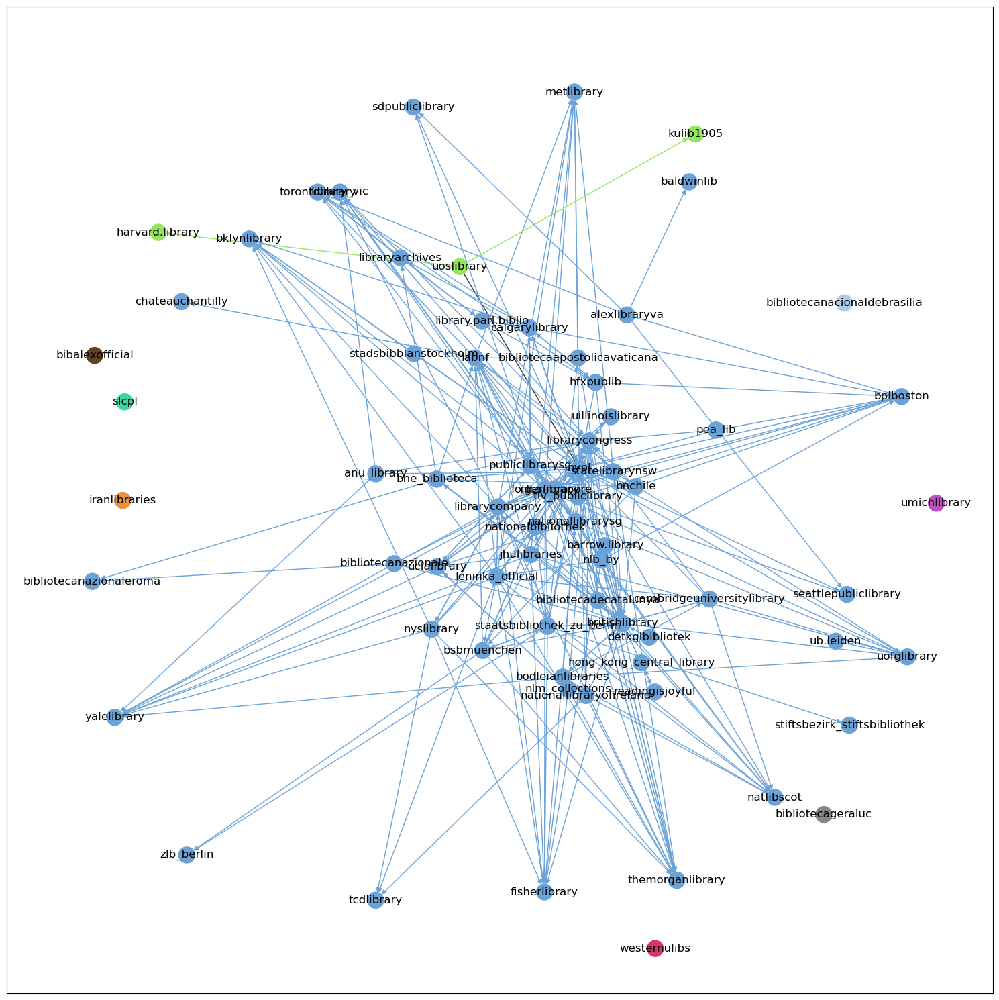

In [24]:
# node and edge communities
set_node_community(G, top_level_communities)
set_edge_community(G)

# community color for nodes
node_color = [get_color(G.nodes[v]['community']) for v in G.nodes]
# community color for internal edges
external = [(v, w) for v, w in G.edges if G.edges[v, w]['community'] == 0]
internal = [(v, w) for v, w in G.edges if G.edges[v, w]['community'] > 0]
internal_color = [get_color(G.edges[e]['community']) for e in internal]
node_pos = nx.spring_layout(G)



nx.draw_networkx(
    G, pos=node_pos, node_size=0,
    edgelist=external, edge_color="#333333", with_labels=False)


nx.draw_networkx(
    G, pos=node_pos, node_color=node_color,
    edgelist=internal, edge_color=internal_color)

In [65]:
statdata=pd.read_csv("librarystats.csv")
df=pd.DataFrame(statdata)
df.columns
df.head()


,Unnamed: 0,Name,Instagram user,Followers,Following,Mediacount,Hashtagged,number of vistors per year(million),Funding Provider,Access,Type,Budget (if available)
0,0,British Library,britishlibrary,379586,189,1995,70947,1.6,NaN,NaN,Academic/Scientific,NaN
1,1,Library of Congress,librarycongress,155115,27,2013,914,1.9,NaN,NaN,Academic/Scientific,NaN
2,2,New York Public Library,nypl,506012,478,4361,172956,16.0,NaN,NaN,General,NaN
3,3,Library and Archives Canada,libraryarchives,13237,395,270,1569,2.8,NaN,NaN,Academic/Scientific,NaN
4,4,Russian State Library,leninka_official,14046,384,1516,1081,0.8,NaN,NaN,Academic/Scientific,NaN


<AxesSubplot:xlabel='Name'>

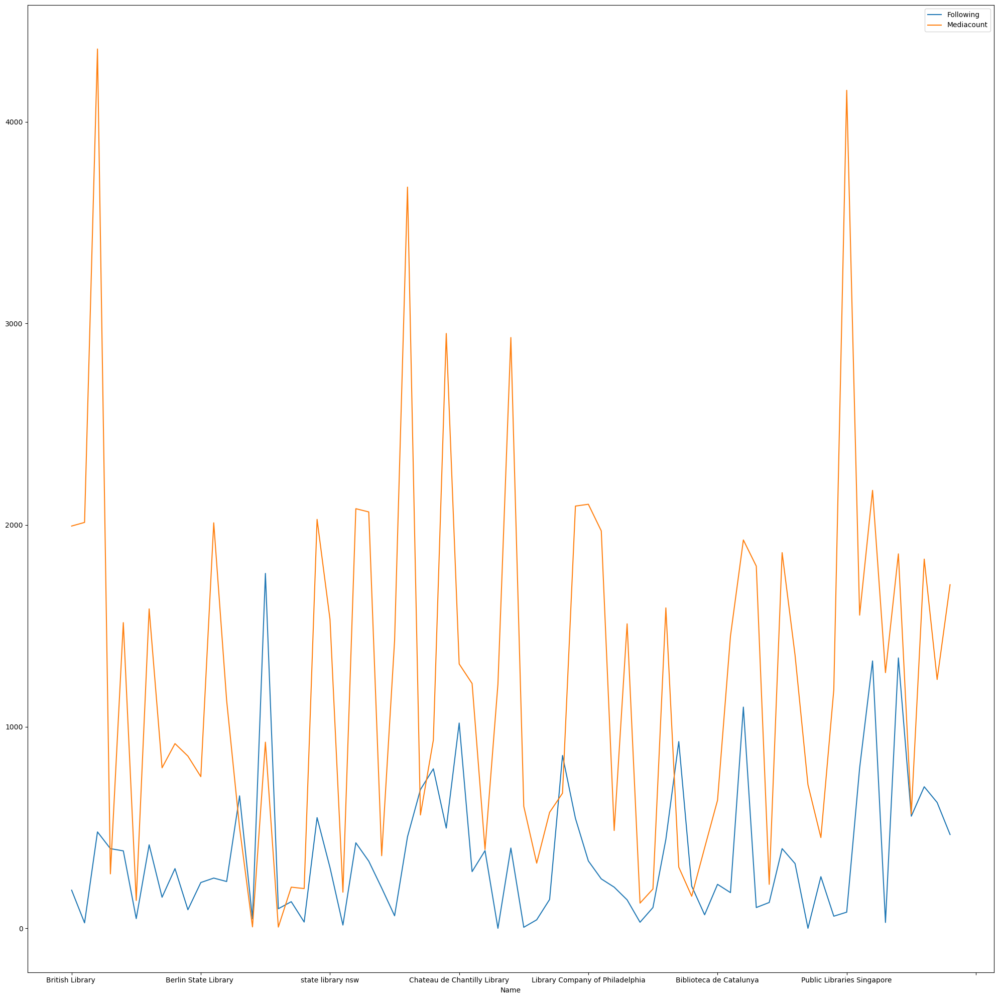

In [43]:
df.plot(x="Name", y=["Following", "Mediacount"],
        kind="line", figsize=(20, 20))

In [37]:

df["number of vistors per year(million)"]=df["number of vistors per year(million)"]*10000
df

,Unnamed: 0,Name,Instagram user,Followers,Following,Mediacount,Hashtagged,number of vistors per year(million),Funding Provider,Access,Type,Budget (if available)
0,0,British Library,britishlibrary,379586,189,1995,70947,16000.0,NaN,NaN,Academic/Scientific,NaN
1,1,Library of Congress,librarycongress,155115,27,2013,914,19000.0,NaN,NaN,Academic/Scientific,NaN
2,2,New York Public Library,nypl,506012,478,4361,172956,160000.0,NaN,NaN,General,NaN
3,3,Library and Archives Canada,libraryarchives,13237,395,270,1569,28000.0,NaN,NaN,Academic/Scientific,NaN
4,4,Russian State Library,leninka_official,14046,384,1516,1081,8000.0,NaN,NaN,Academic/Scientific,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
64,64,Toronto Public Library,torontolibrary,37675,1341,1857,7601,40000.0,NaN,NaN,General,NaN
65,65,Western Libraries,westernulibs,3026,556,567,22,30000.0,NaN,NaN,General,NaN
66,66,University Of Glasgow Library,uofglibrary,18416,702,1831,3734,24700.0,NaN,NaN,Academic/Scientific,NaN
67,67,National Library of Scotland,natlibscot,12905,624,1234,1065,9000.0,NaN,NaN,Academic/Scientific,NaN


<AxesSubplot:xlabel='Name'>

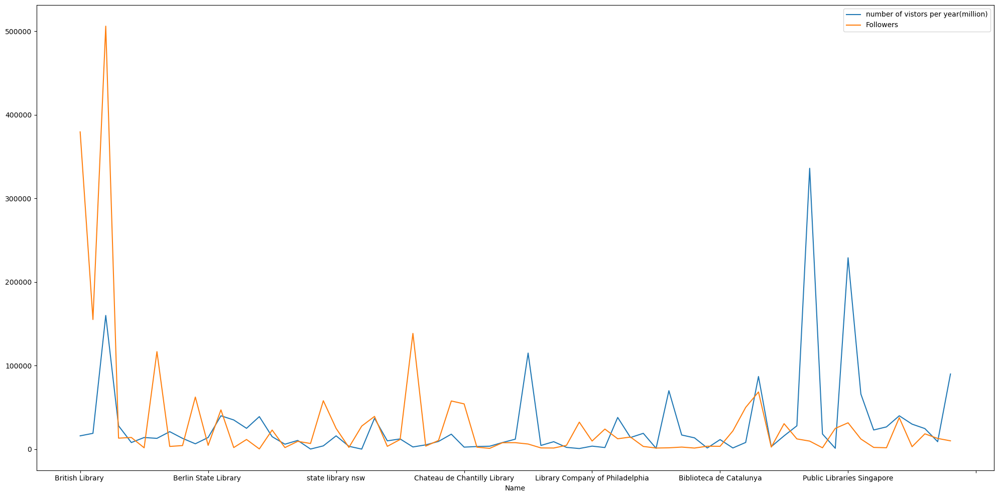

In [42]:
#number of likes on last 5-10 posts of an account
#community analysis


df.plot(x="Name", y=["number of vistors per year(million)", "Followers"],
        kind="line", figsize=(20, 10))

In [ ]:
#if it is government funded or private,- ok
#access - is it open to all, or private, if private, what is the fee - ok
#academic or non academic - ok
#analysis of following - wordcloud
#community analysis
#likes on the past few posts
#revenue if possible - not possible 
#budget
#remove barrow library, public libraries singapore

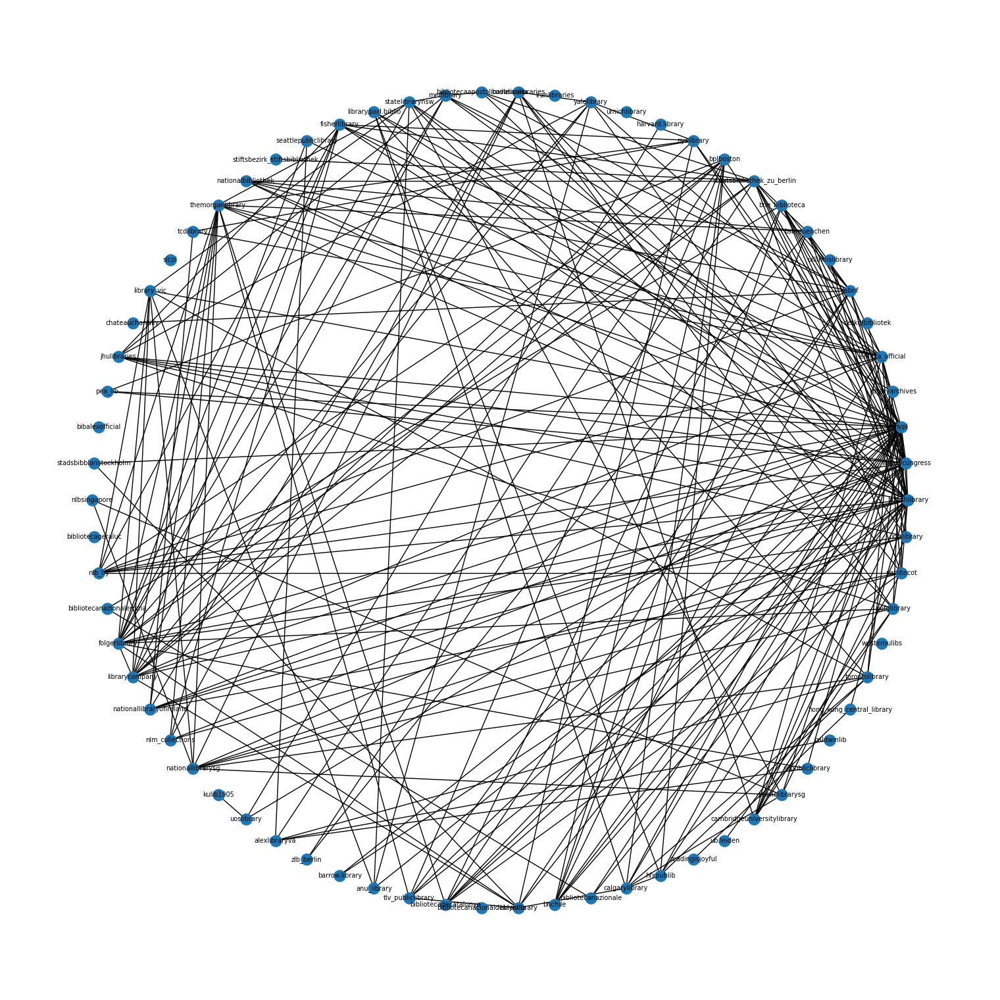

In [94]:
G_undirected=G.to_undirected()
#G_undirected=G.to_undirected(reciprocal=True)

nx.draw_circular(G_undirected,with_labels=True,node_size=150,font_size=7)


{'britishlibrary': Text(1.0, -3.860072728782228e-09, 'britishlibrary'),
 'librarycongress': Text(0.995974302307724, 0.08963930185533339, 'librarycongress'),
 'nypl': Text(0.9839295745528814, 0.17855688473231895, 'nypl'),
 'libraryarchives': Text(0.9639628530967846, 0.2660368333853061, 'libraryarchives'),
 'leninka_official': Text(0.9362348916657598, 0.3513748295320802, 'leninka_official'),
 'detkglbibliotek': Text(0.900968850048967, 0.4338837508303765, 'detkglbibliotek'),
 'labnf': Text(0.8584488039822871, 0.5128992737144672, 'labnf'),
 'uillinoislibrary': Text(0.8090170033346724, 0.5877852378131697, 'uillinoislibrary'),
 'bsbmuenchen': Text(0.7530714879223657, 0.6579387123446331, 'bsbmuenchen'),
 'bne_biblioteca': Text(0.6910626900441604, 0.7227948240925455, 'bne_biblioteca'),
 'staatsbibliothek_zu_berlin': Text(0.6234897985980848, 0.7818314959753754, 'staatsbibliothek_zu_berlin'),
 'bplboston': Text(0.550897003988795, 0.8345732617436218, 'bplboston'),
 'nyslibrary': Text(0.4738686999

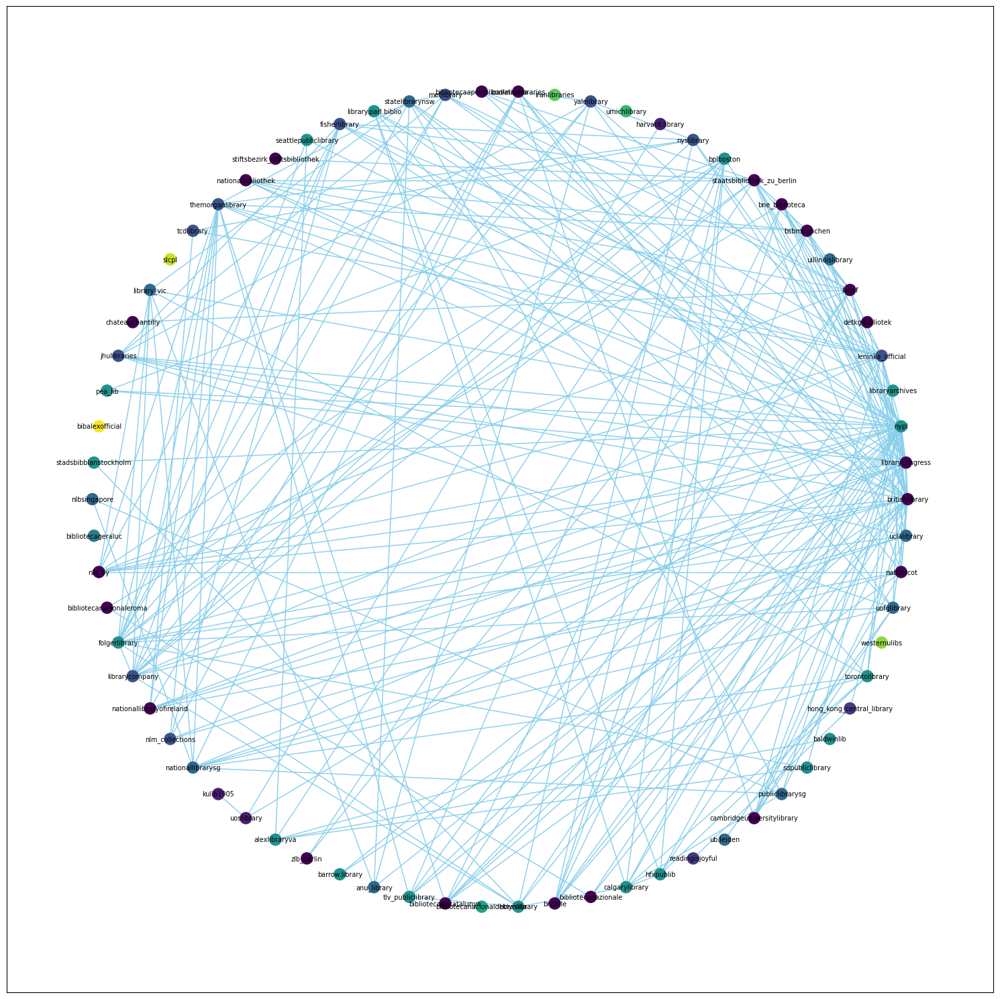

In [97]:
followers_dict = dict(zip(df['Instagram user'], df['Followers']))
#followers_dict

nx.set_node_attributes(G_undirected, followers_dict, 'followers')

partition = community.best_partition(G_undirected, weight='followers')

# Draw the graph with nodes colored according to their community
pos = nx.circular_layout(G_undirected)
nx.draw_networkx_nodes(G_undirected, pos, node_color=list(partition.values()), node_size=150, cmap='viridis')
nx.draw_networkx_edges(G_undirected, pos, edge_color="skyblue")
nx.draw_networkx_labels(G_undirected, pos, font_size=7)

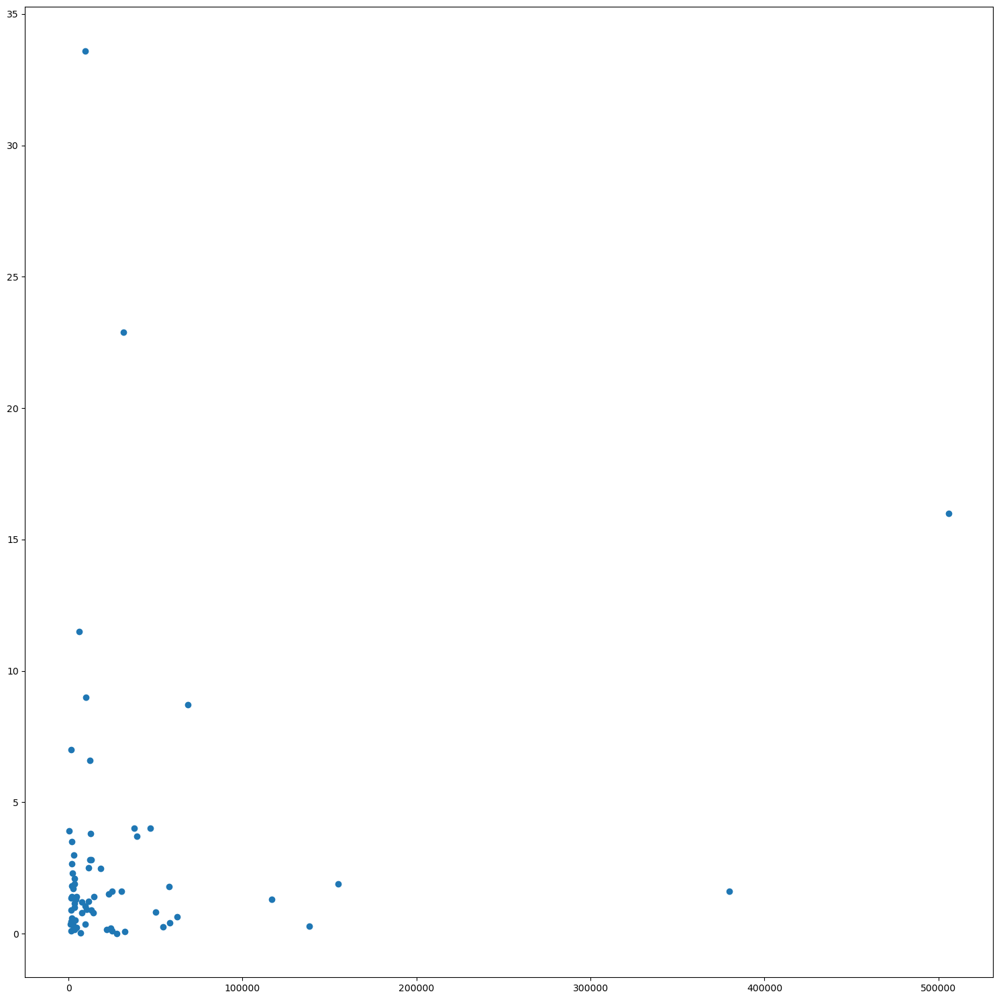

In [68]:
#Scatter plot of visitors vs followers
plt.scatter(x=df["Followers"],y=df["number of vistors per year(million)"])

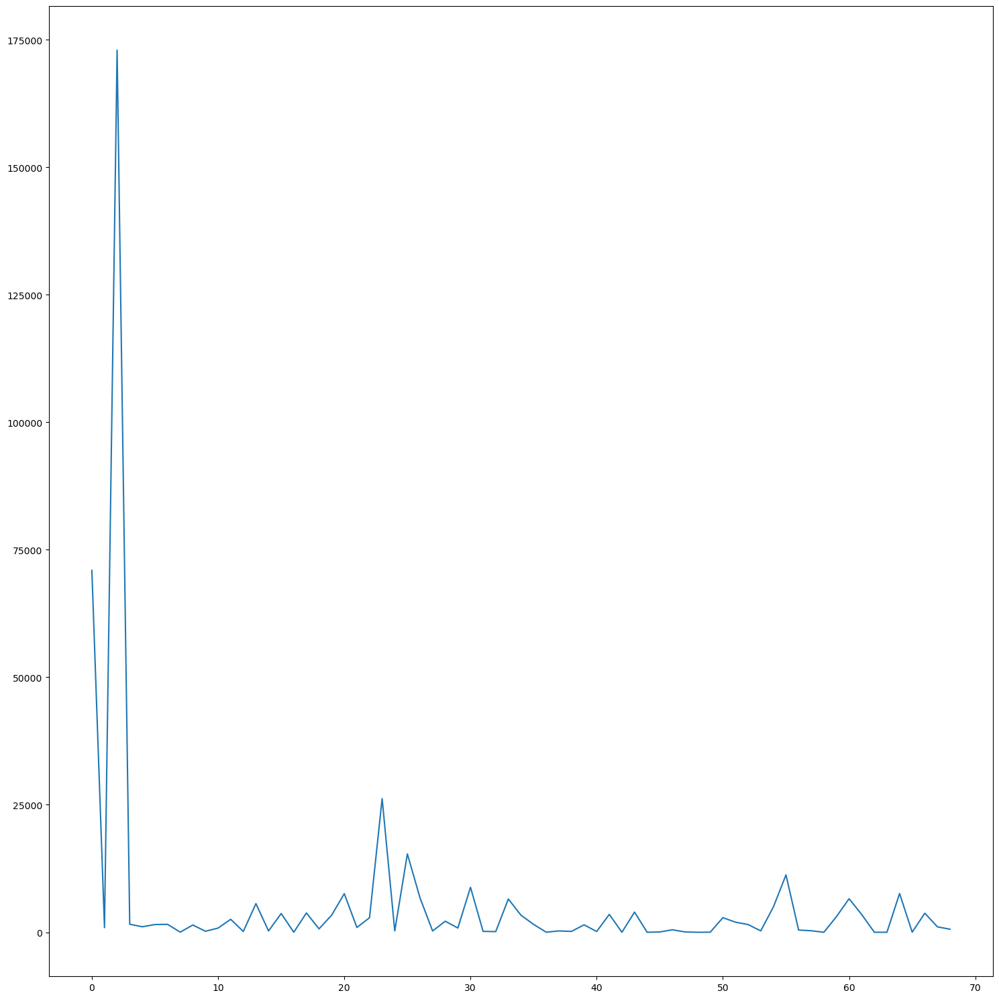

In [73]:
plt.plot(df["Hashtagged"])

In [81]:
c1=comx.greedy_modularity_communities(G, weight=None, resolution=1, cutoff=1, best_n=None)

#len(c1)


13

In [ ]:
#Scatter plot of visitors vs media shared
#Scatter plot of followers vs media shared
#Then independent scatter plot of number of followers, visitors colored by type of library and funding
#Network centrality measures - analyse most influential and most non influential nodes
#Form communities within general libraries, within academic ones, see how many libraries from one region follow another, one type follow another

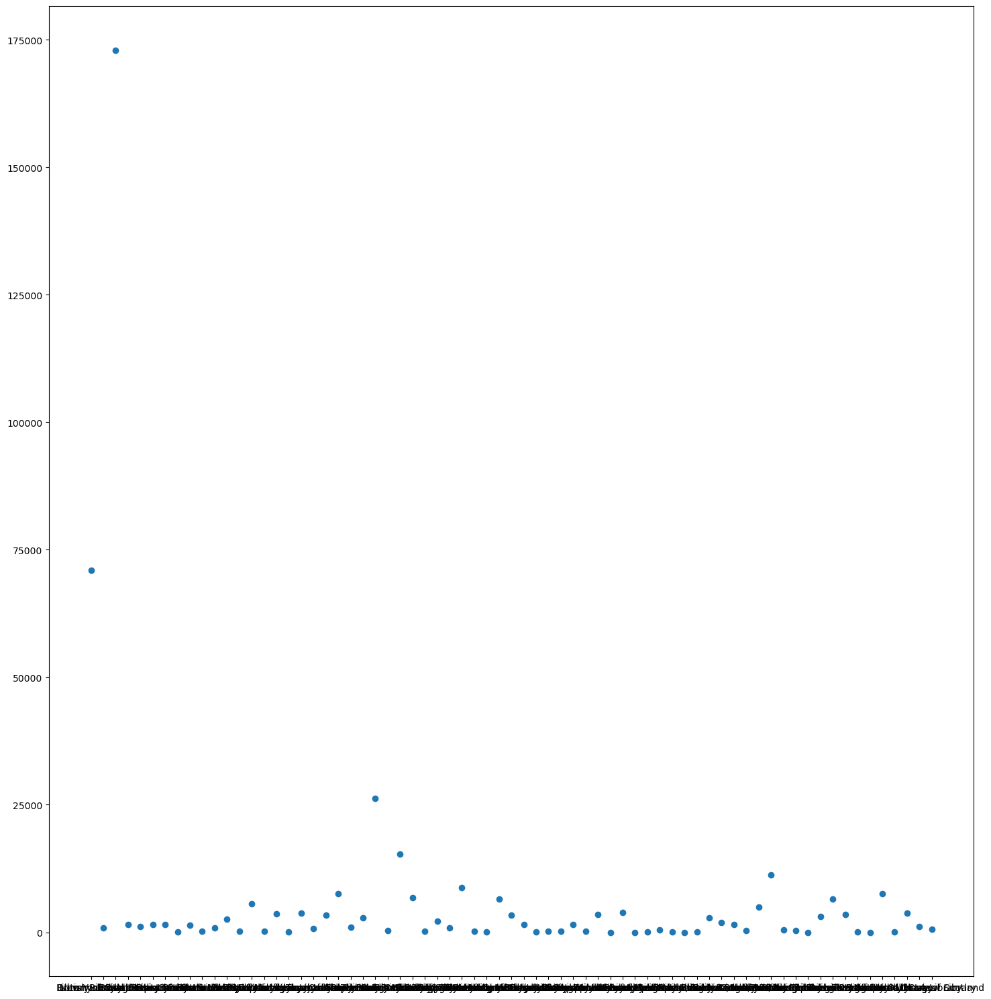

In [86]:
#plt.scatter(x=df["Name"],y=df["Hashtagged"],c=df["Type"])
plt.scatter(x=df["Name"],y=df["Hashtagged"])

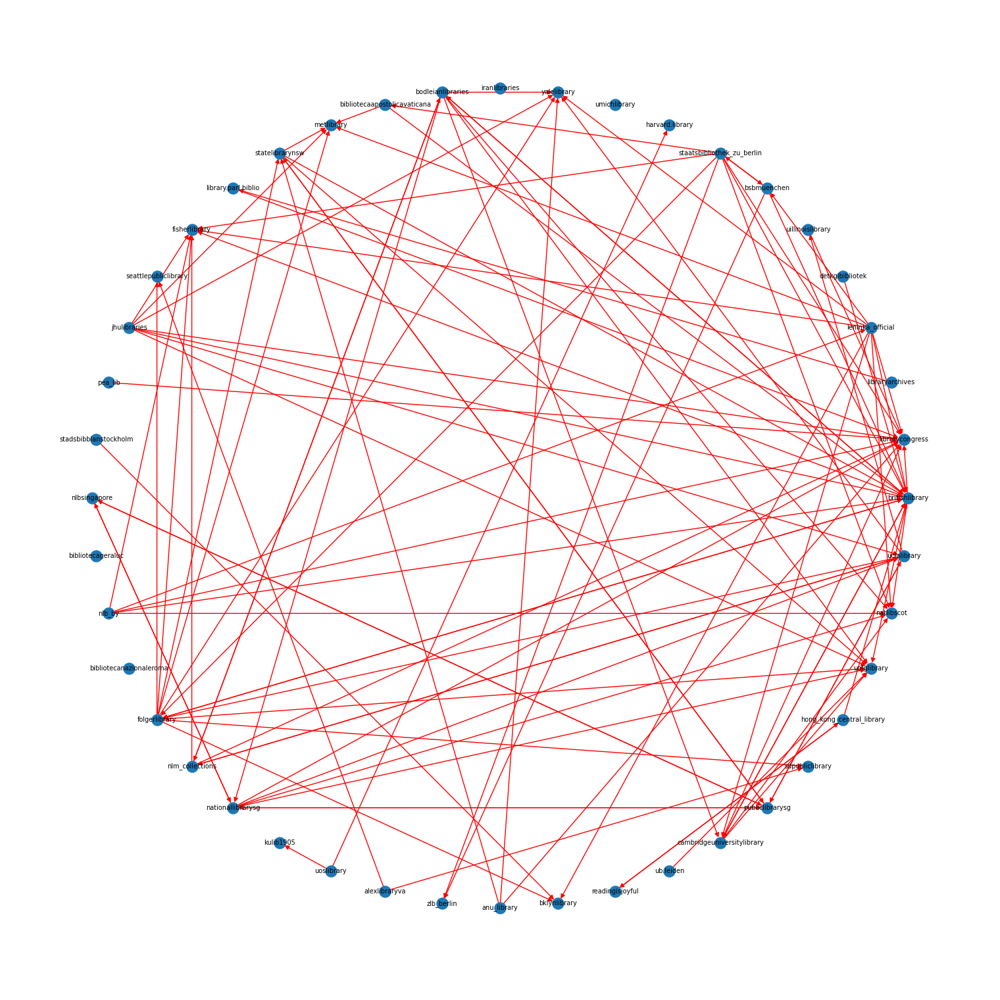

In [104]:
#the relationship between academic libraries:
dfsc=df.loc[df['Type'] == "Academic/Scientific"]
dfsc.head()

G2=G.subgraph(dfsc["Instagram user"])

nx.draw_circular(G2,with_labels=True,node_size=150,font_size=7,edge_color="red")


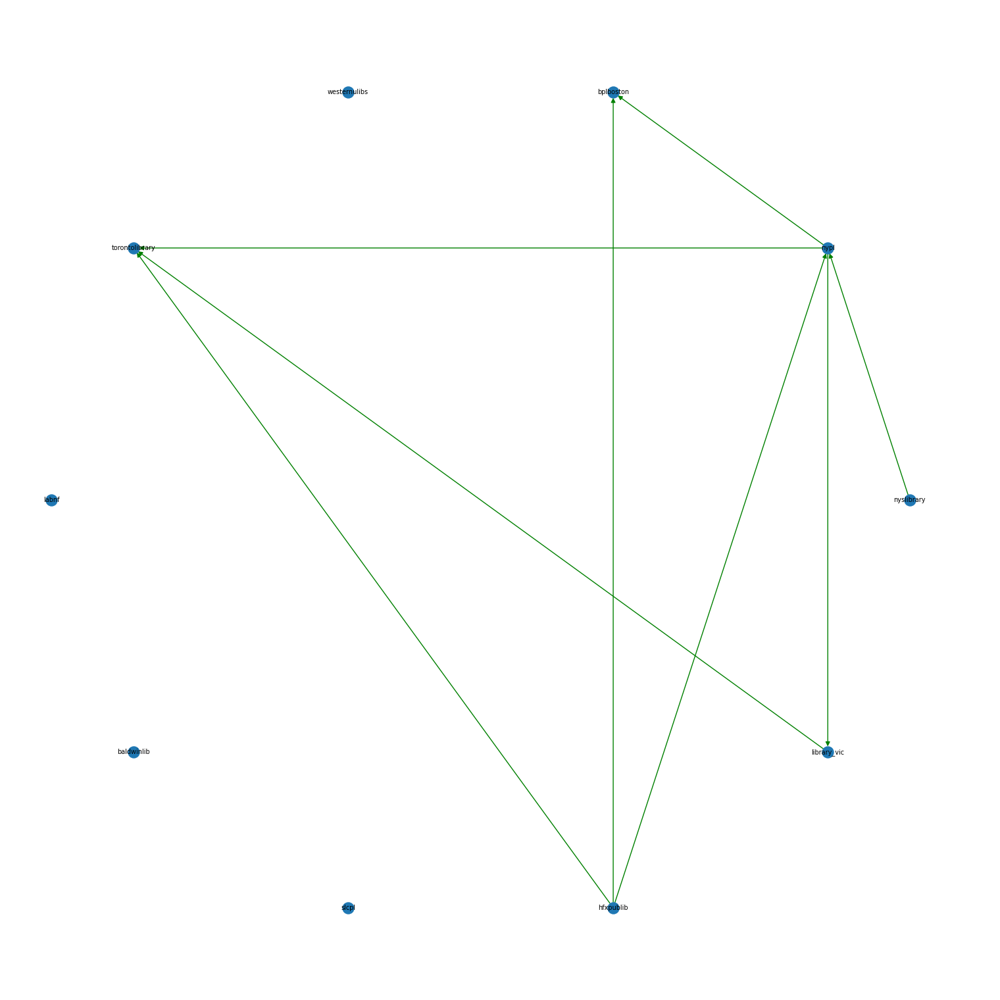

In [106]:
#the relationship between academic libraries:
dfgen=df.loc[df['Type'] == "General"]
dfgen.head()

G3=G.subgraph(dfgen["Instagram user"])

nx.draw_circular(G3,with_labels=True,node_size=150,font_size=7,edge_color="green")

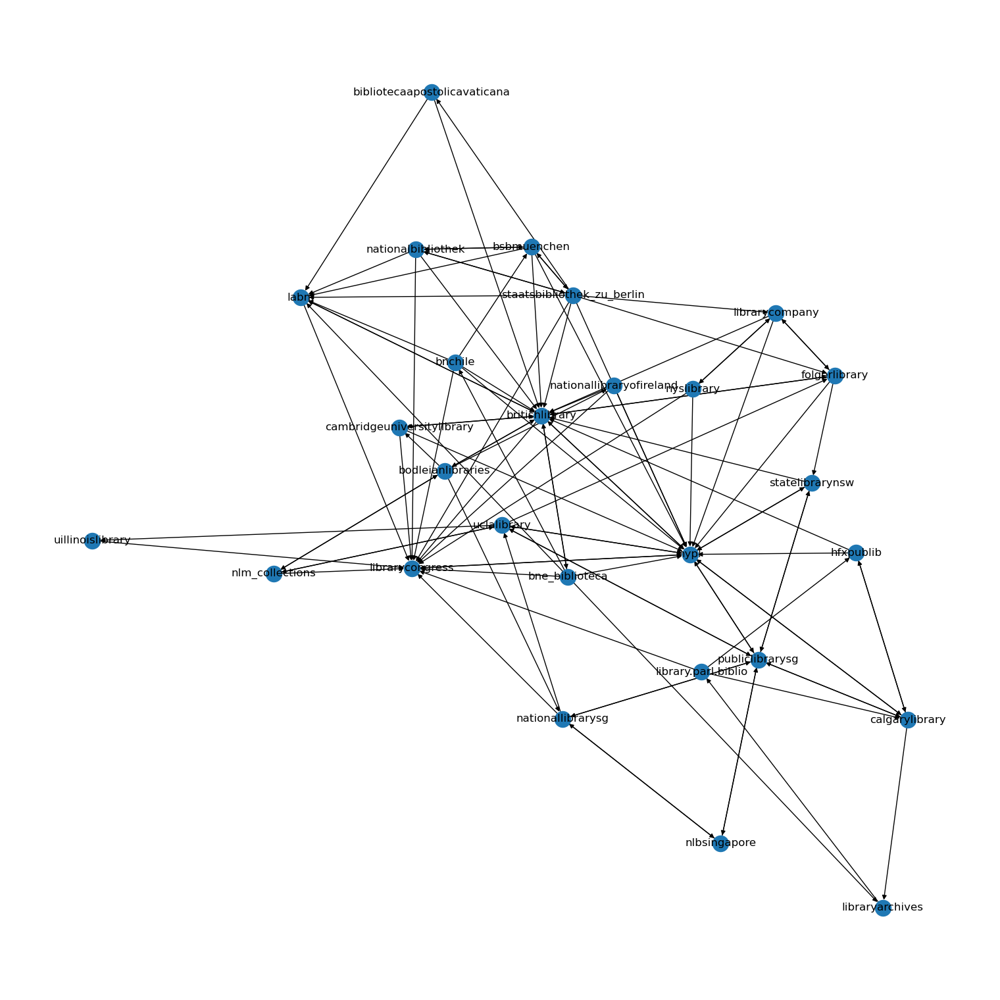

In [117]:
#checking if a small world network can be considered:

# get strongly connected components
scc = list(nx.strongly_connected_components(G))

# create subgraph of largest strongly connected component
largest_scc = max(scc, key=len)
H = G.subgraph(largest_scc)
nx.draw(H,with_labels=True)


In [123]:
H_undirected=H.to_undirected()

aspl = nx.average_shortest_path_length(H_undirected)
# Step 2: Calculate the clustering coefficient
cc = nx.average_clustering(H_undirected)

aspl,cc

(1.9715099715099715, 0.4964704020259576)

In [143]:
# Step 3: Generate an equivalent random graph
num_nodes = H.number_of_nodes()
num_edges = H.number_of_edges()
random_H = nx.fast_gnp_random_graph(num_nodes, num_edges/(num_nodes*(num_nodes-1)/2))

# Step 4: Calculate the average shortest path length and clustering coefficient of the random graph
random_aspl = nx.average_shortest_path_length(random_H)
random_cc = nx.average_clustering(random_H)

random_aspl,random_cc

(1.7037037037037037, 0.3205212482990261)

In [144]:
import math
if cc/random_cc > 1 and aspl/random_aspl < math.log(num_nodes)/math.log(2):
    print("The graph is a small-world network")
else:
    print("The graph is not a small-world network")

The graph is a small-world network


In [ ]:
'''
G1=nx.DiGraph()

for j in range(0,dfgen.shape[0]):
    G1.add_node(df["Instagram user"][j])

def adding(df,libname):
    df.insert(len(df.columns),"{lname}".format(lname=libname),0)
    return df
    
dffolgen=dfgen.copy()

for j in range(0,dfgen.shape[0]):
    dffolgen=adding(dffolgen,dfgen.iloc[j,1])

    

#fig = plt.figure(6, figsize=(200, 200))
#fig=plt.figure(figsize=(200,200))
nx.draw(G1,with_labels=True,node_size=150,font_size=7)
plt.show()
'''